## Configs and Hyperparameters

Support a variety of models, you can find more pretrained model from [Tensorflow detection model zoo: COCO-trained models](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md#coco-trained-models), as well as their pipline config files in [object_detection/samples/configs/](https://github.com/tensorflow/models/tree/master/research/object_detection/samples/configs).

In [1]:
import tensorflow as tf
# print(tf.test.is_built_with_cuda())
# print(tf.config.list_physical_devices('GPU')) 

In [2]:
import sys
sys.path.insert(0, 'D:\\Project\\ait\\models\\')
sys.path.insert(0, 'D:\\Project\\ait\\models\\research')
sys.path.insert(0, 'D:\\Project\\ait\\models\\research\\object_detection')
sys.path.insert(0, 'D:\\Project\\ait\\models\\research\\slim')
print(sys.path)

['D:\\Project\\ait\\models\\research\\slim', 'D:\\Project\\ait\\models\\research\\object_detection', 'D:\\Project\\ait\\models\\research', 'D:\\Project\\ait\\models\\', 'D:\\Project\\ait\\code', 'D:\\Project\\AiTalents\\models', 'D:\\Project\\AiTalents\\models\\research', 'D:\\Project\\AiTalents\\models\\research\\object_detection', 'D:\\Project\\AiTalents\\models\\research\\slim', 'D:\\Project\\ait\\code', 'C:\\Users\\User\\anaconda3\\envs\\tensorflow\\python38.zip', 'C:\\Users\\User\\anaconda3\\envs\\tensorflow\\DLLs', 'C:\\Users\\User\\anaconda3\\envs\\tensorflow\\lib', 'C:\\Users\\User\\anaconda3\\envs\\tensorflow', '', 'C:\\Users\\User\\AppData\\Roaming\\Python\\Python38\\site-packages', 'C:\\Users\\User\\anaconda3\\envs\\tensorflow\\lib\\site-packages', 'C:\\Users\\User\\anaconda3\\envs\\tensorflow\\lib\\site-packages\\win32', 'C:\\Users\\User\\anaconda3\\envs\\tensorflow\\lib\\site-packages\\win32\\lib', 'C:\\Users\\User\\anaconda3\\envs\\tensorflow\\lib\\site-packages\\Pythonwi

In [14]:
# Number of training steps - 1000 will train very quickly, but more steps will increase accuracy.
num_steps = 6000  # 200000 to improve

# Number of evaluation steps.
num_eval_steps = 50

MODELS_CONFIG = {
    'ssd_mobilenet_v2_fpnlite': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
        'pipeline_file': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config',
        'batch_size': 12
    }, 
    'ssd_mobilenet_v2': { ## BAD LOSS 
        'model_name': 'ssd_mobilenet_v2_320x320_coco17_tpu-8',
        'pipeline_file': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.config',
        'batch_size': 12
    }, 
    'ssd_resnet50_v1': { ## CAN'T RUN 
        'model_name': 'ssd_resnet50_v1_fpn_640x640_coco17_tpu-8',
        'pipeline_file': 'ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.config',
        'batch_size': 8
    }, 
}
# Pick the model you want to use
# Select a model in `MODELS_CONFIG`.
selected_model = 'ssd_mobilenet_v2_fpnlite'

# Name of the object detection model to use.
MODEL = MODELS_CONFIG[selected_model]['model_name']

# Name of the pipline file in tensorflow object detection API.
pipeline_file = MODELS_CONFIG[selected_model]['pipeline_file']

# Training batch size fits in Colabe's Tesla K80 GPU memory for selected model.
batch_size = MODELS_CONFIG[selected_model]['batch_size']

## Install required packages

In [15]:
# %cd /content
# !git clone --quiet https://github.com/tensorflow/models.git
# %cd D:/Project/AiTalents
!pip install tf_slim

# !apt-get install -qq protobuf-compiler python-pil python-lxml python-tk

!pip install -q Cython contextlib2 pillow lxml matplotlib

!pip install -q pycocotools

!pip install lvis

!pip install opencv-python

# %cd models/research/
# %SET PYTHONPATH=%cd%;%cd%\slim
# !protoc object_detection/protos/*.proto --python_out=.

# import os
# os.environ['PYTHONPATH'] += ':models/research/:models/research/slim/'


# !python models/research/object_detection/builders/model_builder_test.py

## Prepare `tfrecord` files

Roboflow automatically creates our TFRecord and label_map files that we need!

**Generating your own TFRecords the only step you need to change for your own custom dataset.**

Because we need one TFRecord file for our training data, and one TFRecord file for our test data, we'll create two separate datasets in Roboflow and generate one set of TFRecords for each.

To create a dataset in Roboflow and generate TFRecords, follow [this step-by-step guide](https://blog.roboflow.ai/getting-started-with-roboflow/).

In [16]:
# NOTE: Update these TFRecord names from "cells" and "cells_label_map" to your files!
test_record_fname = 'D:/Project/ait/dataset/processed/test.tfrecord'
train_record_fname = 'D:/Project/ait/dataset/processed/train.tfrecord'
label_map_pbtxt_fname = 'D:/Project/ait/dataset/processed/class.pbtxt'
checkpoint_type = 'detection'

## Download base model

In [17]:
import os
import shutil
import glob
import urllib.request
import tarfile
MODEL_FILE = MODEL + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/'
DEST_DIR = '../models/research/pretrained_model_tf2/'

if not (os.path.exists(MODEL_FILE)):
    urllib.request.urlretrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)

tar = tarfile.open(MODEL_FILE)
tar.extractall()
tar.close()

os.remove(MODEL_FILE)
if (os.path.exists(DEST_DIR)):
    shutil.rmtree(DEST_DIR)
os.rename(MODEL, DEST_DIR)

In [18]:
# fine_tune_checkpoint = os.path.join(DEST_DIR, "model.ckpt")
fine_tune_checkpoint = "D:/Project/ait/models/research/pretrained_model_tf2/checkpoint/ckpt-0"
fine_tune_checkpoint

'D:/Project/ait/models/research/pretrained_model_tf2/checkpoint/ckpt-0'

## Configuring a Training Pipeline

In [19]:
import os
import shutil
pipeline_fname = os.path.join(DEST_DIR, pipeline_file)
shutil.copy2(os.path.join('../models/research/object_detection/configs/tf2/', pipeline_file),pipeline_fname)
assert os.path.isfile(pipeline_fname), '`{}` not exist'.format(pipeline_fname)

In [20]:
def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())

In [21]:
import re

num_classes = get_num_classes(label_map_pbtxt_fname)
with open(pipeline_fname) as f:
    s = f.read()
with open(pipeline_fname, 'w') as f:
    
    # fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)
    
    # tfrecord files train and test.
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train2017)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val2017)(.*?")', 'input_path: "{}"'.format(test_record_fname), s)

    # label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)
    
    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)
    
    s = re.sub('fine_tune_checkpoint_type: ".*?"', 'fine_tune_checkpoint_type: "{}"'.format(checkpoint_type), s)
    f.write(s)

In [22]:
# !type {pipeline_fname}

In [23]:
import os
model_dir = '../training_tf2/'
# Optionally remove content in output model directory to fresh start.
import shutil
shutil.rmtree(model_dir)
os.makedirs(model_dir, exist_ok=True)

## Train the model

In [ ]:
!python ../models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_fname} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --num_eval_steps={num_eval_steps}

## Exporting a Trained Inference Graph
Once your training job is complete, you need to extract the newly trained inference graph, which will be later used to perform the object detection. This can be done as follows:

In [ ]:
import re
import numpy as np
import os

output_directory = '../fine_tuned_model_tf2'
model_dir = '../training_tf2/'

lst = os.listdir(model_dir)
lst = [l for l in lst if 'ckpt-' in l]
steps=np.array([int(re.findall('\d+', l)[0]) for l in lst])
last_model = lst[steps.argmax()]

last_model_path = os.path.join(model_dir, last_model).split(".")[0]
print(last_model_path)
# !python models/research/object_detection/export_inference_graph.py \
#     --input_type=image_tensor \
#     --pipeline_config_path={pipeline_fname} \
#     --output_directory={output_directory} \
#     --trained_checkpoint_prefix={last_model_path}

!python ../models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir={model_dir} \
    --pipeline_config_path={pipeline_fname} \
    --output_directory={output_directory}

## Run inference test
Test with images in repository `tensorflow-object-detection/test` directory.

**To test with your own images, you need to place your images inside the `test` directory in this Colab notebook!** More on this below.

In [32]:
import os
import glob

# Path to frozen detection graph. This is the actual model that is used for the object detection.
# PATH_TO_CKPT = "../fine_tuned_model_tf2/saved_model/saved_model.pb"
PATH_TO_CKPT = "../fine_tuned_model_tf2_fpnlite/saved_model/saved_model.pb"

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = "../dataset/processed/class.pbtxt"

# If you want to test the code with your images, just add images files to the PATH_TO_TEST_IMAGES_DIR.
PATH_TO_TEST_IMAGES_DIR =  "../dataset/processed/master_splitted/Test"

assert os.path.isfile(PATH_TO_CKPT)
assert os.path.isfile(PATH_TO_LABELS)
TEST_IMAGE_PATHS = glob.glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, "*.*"))
assert len(TEST_IMAGE_PATHS) > 0, 'No image found in `{}`.'.format(PATH_TO_TEST_IMAGES_DIR)
print(TEST_IMAGE_PATHS)

['../dataset/processed/master_splitted/Test\\OK_TBS_S_200016.jpg', '../dataset/processed/master_splitted/Test\\OK_TBS_S_200017.jpg', '../dataset/processed/master_splitted/Test\\OK_TBS_S_200023.jpg', '../dataset/processed/master_splitted/Test\\OK_TBS_S_200026.jpg', '../dataset/processed/master_splitted/Test\\OK_TBS_S_200028.jpg', '../dataset/processed/master_splitted/Test\\OK_TBS_S_200031.jpg', '../dataset/processed/master_splitted/Test\\OK_TBS_S_200034.jpg', '../dataset/processed/master_splitted/Test\\OK_TBS_S_200035.jpg', '../dataset/processed/master_splitted/Test\\OK_TBS_S_200038.jpg', '../dataset/processed/master_splitted/Test\\OK_TBS_S_200039.jpg', '../dataset/processed/master_splitted/Test\\OK_TBS_S_200042.jpg', '../dataset/processed/master_splitted/Test\\OK_TBS_S_200044.jpg', '../dataset/processed/master_splitted/Test\\OK_TBS_S_200046.jpg', '../dataset/processed/master_splitted/Test\\OK_TBS_S_200047.jpg', '../dataset/processed/master_splitted/Test\\OK_TBS_S_200048.jpg', '../datas

In [33]:
import io
import os
import scipy.misc
import numpy as np
import six
import time
import glob
from IPython.display import display

from six import BytesIO

import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

%matplotlib inline

In [34]:
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
    path: a file path (this can be local or on colossus)

    Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
    """
    img_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(img_data))
    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)

In [35]:
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [37]:
tf.keras.backend.clear_session()
# model = tf.saved_model.load(f'../fine_tuned_model_tf2/saved_model/')
model = tf.saved_model.load(f'../fine_tuned_model_tf2_fpnlite/saved_model/')

In [38]:
def run_inference_for_single_image(model, image):
    image = np.asarray(image)
    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]

    # Run inference
    model_fn = model.signatures["serving_default"]
    output_dict = model_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    print(output_dict["num_detections"])
    tf.print(output_dict["num_detections"])
#     print(tf.dtypes.cast(output_dict["num_detections"], tf.int32))
#     num_detections = int(output_dict.pop("num_detections"))
    num_detections = int(output_dict.pop("num_detections"))
    output_dict = {
        key: value[0, :num_detections].numpy() for key, value in output_dict.items()
    }
    output_dict["num_detections"] = num_detections

    # detection_classes should be ints.
    output_dict["detection_classes"] = output_dict["detection_classes"].astype(np.int64)

    # Handle models with masks:
    if "detection_masks" in output_dict:
        # Reframe the the bbox mask to the image size.
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            output_dict["detection_masks"],
            output_dict["detection_boxes"],
            image.shape[0],
            image.shape[1],
        )
        detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5, tf.uint8)
        output_dict["detection_masks_reframed"] = detection_masks_reframed.numpy()

    return output_dict


In [39]:
tf.__version__

'2.4.0'

../dataset/processed/master_splitted/Test\TDB_M00760.jpg
tf.Tensor([100.], shape=(1,), dtype=float32)
[100]


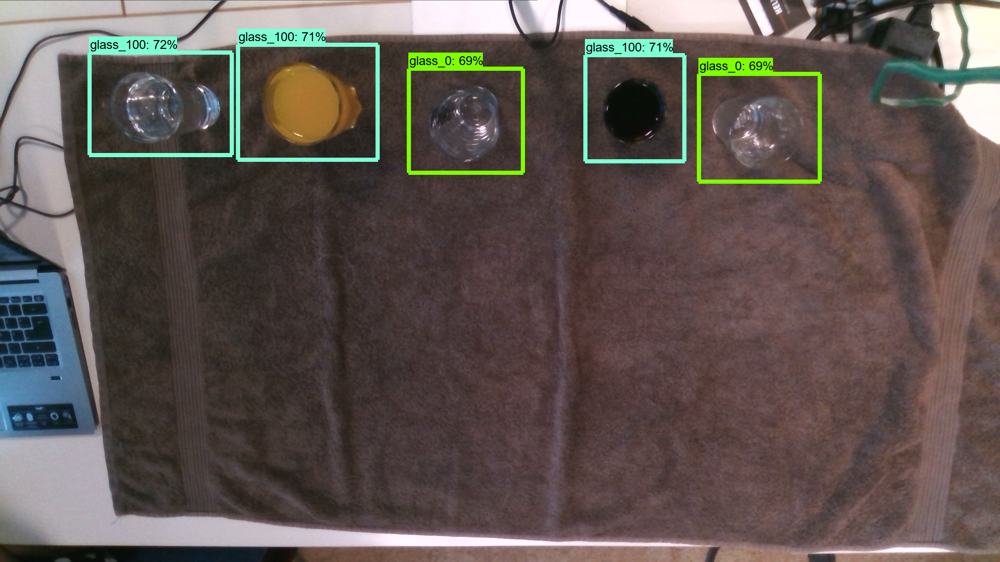

../dataset/processed/master_splitted/Test\OK_TBS_S_200046.jpg
tf.Tensor([100.], shape=(1,), dtype=float32)
[100]


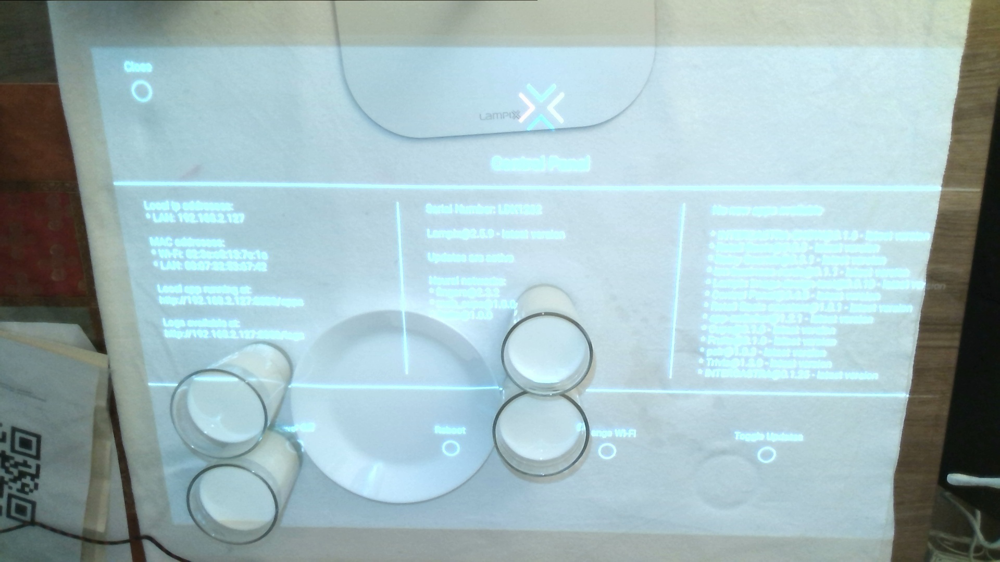

../dataset/processed/master_splitted/Test\TDB_M01605.jpg
tf.Tensor([100.], shape=(1,), dtype=float32)
[100]


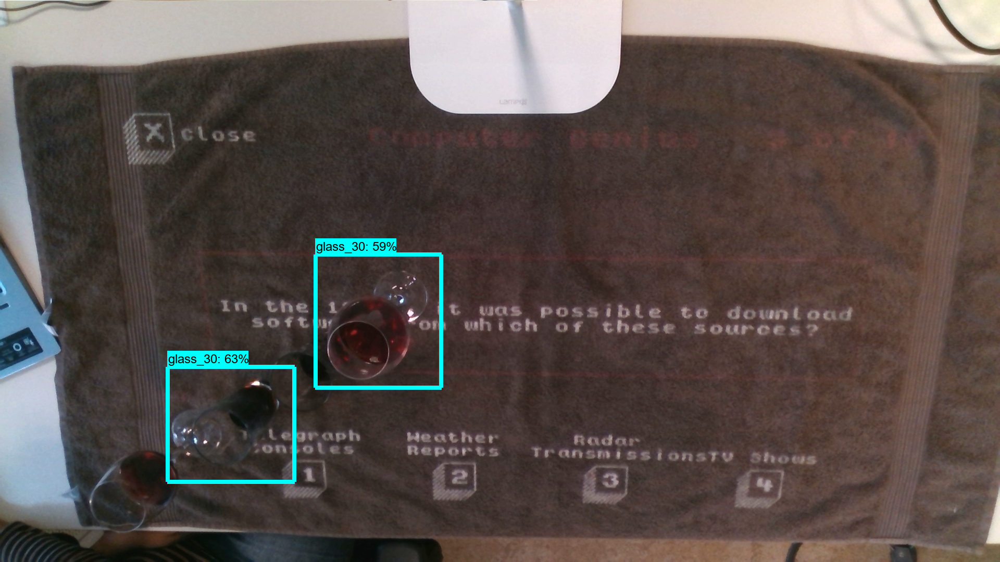

../dataset/processed/master_splitted/Test\OK_TBS_S_3Unknown-102.jpg
tf.Tensor([100.], shape=(1,), dtype=float32)
[100]


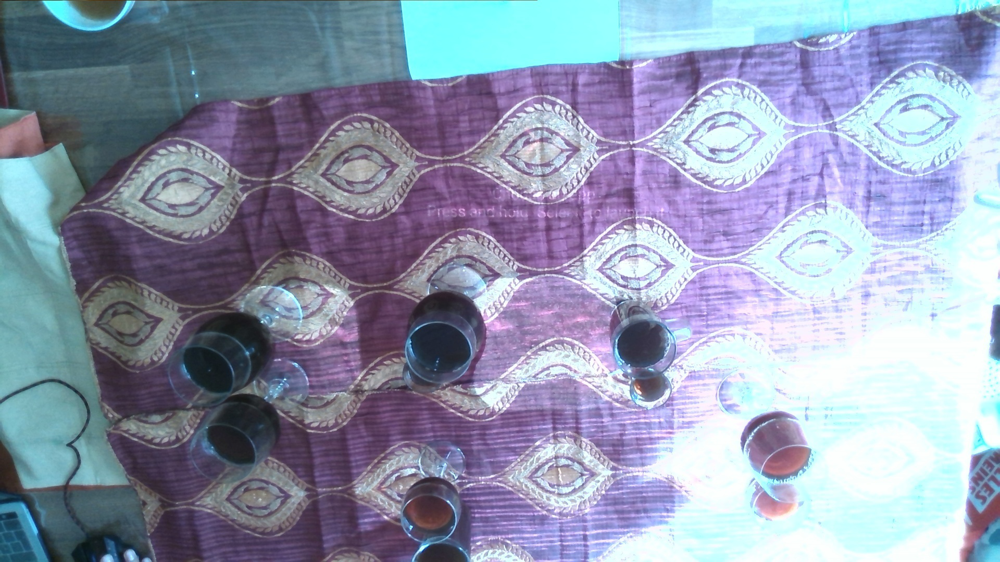

../dataset/processed/master_splitted/Test\OK_TDB-S_1Unknown-286.jpg
tf.Tensor([100.], shape=(1,), dtype=float32)
[100]


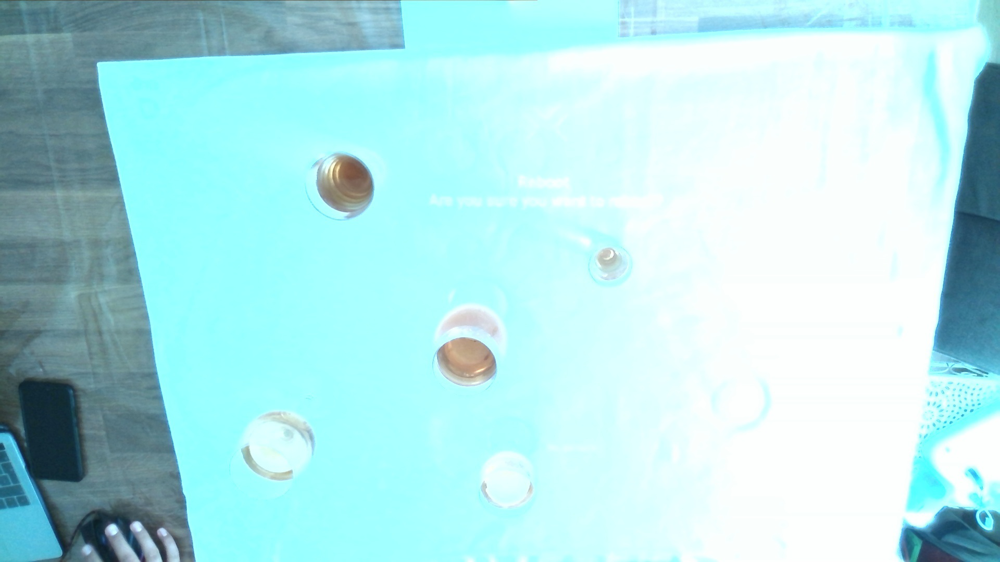

In [40]:
import random
count = 0
test_path = glob.glob("../dataset/processed/master_splitted/Test/*.jpg")
random.shuffle(test_path)
for image_path in test_path:
    print(image_path)
    image_np = load_image_into_numpy_array(image_path)
    output_dict = run_inference_for_single_image(model, image_np)
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        output_dict["detection_boxes"],
        output_dict["detection_classes"],
        output_dict["detection_scores"],
        category_index,
        instance_masks=output_dict.get("detection_masks_reframed", None),
        use_normalized_coordinates=True,
        line_thickness=8,
    )
    display(Image.fromarray(image_np))
    count +=1
    if (count == 5):
        break


In [ ]:
## Convert Saved Model to Tensorflow JS model (model.json)
! tensorflowjs_converter \
    --input_format=tf_saved_model \
    --output_node_names='detection_boxes,detection_classes,detection_features,detection_multiclass_scores,detection_scores,num_detections,raw_detection_boxes,raw_detection_scores' \
    --saved_model_tags=serve \
    ../fine_tuned_model_tf2/saved_model \
    ../fine_tuned_model_tf2/tfjs